In [5]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torch import nn
from torch.nn import Conv2d
from torch.utils.data import DataLoader

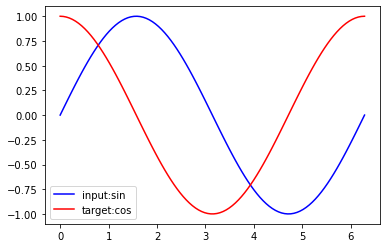

In [4]:
steps = np.linspace(0, np.pi*2, 100, dtype=np.float32)  #从0-2pi，生成100个随机数据
input_X = np.sin(steps)
input_Y = np.cos(steps)
plt.plot(steps, input_X, 'b-', label = 'input:sin')
plt.plot(steps, input_Y, 'r-', label = 'target:cos')
plt.legend(loc= 'best')
plt.show()

In [8]:
class LSTM(nn.Module):
    def __init__(self, INPUT_SIZE):
        super(LSTM, self).__init__()

        self.lstm = nn.LSTM(
            input_size=INPUT_SIZE,
            hidden_size=20,
            batch_first=True
        )
        self.out = nn.Linear(20, 1)

    def forward(self, x, h_state, c_state):
        r_out, (h_state, c_state) = self.lstm(x, (h_state, c_state))
        outputs = self.out(r_out[0,:]).unsqueeze(0)
        return outputs, h_state, c_state

    def InitHidden(self):
        h_state = torch.randn(1, 1, 20)
        c_state = torch.randn(1, 1, 20)
        return h_state, c_state

In [9]:
lstm = LSTM(INPUT_SIZE=1)
opt = torch.optim.Adam(lstm.parameters(), lr=0.001)
loss_func = nn.MSELoss()

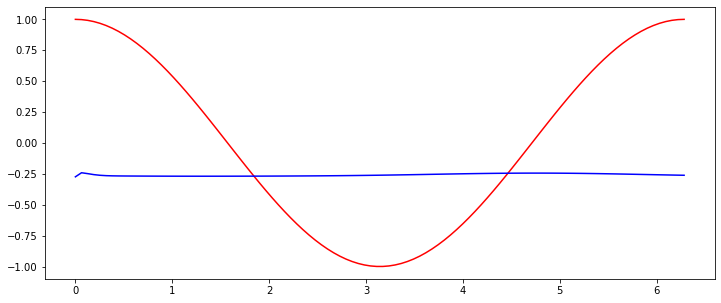

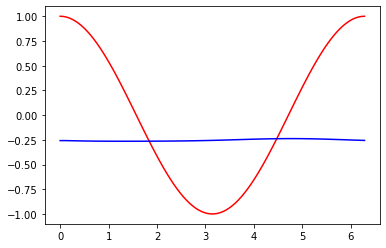

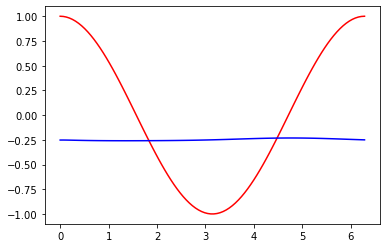

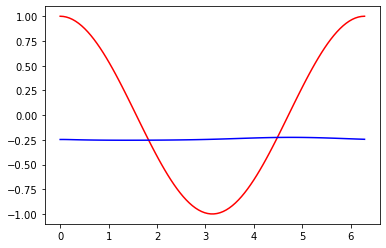

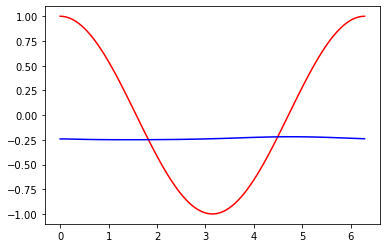

...

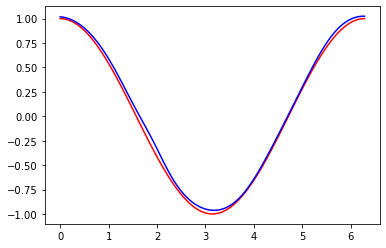

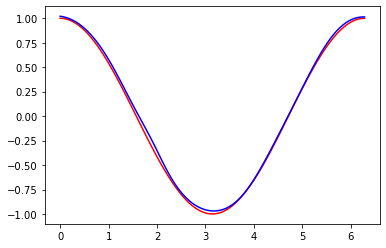

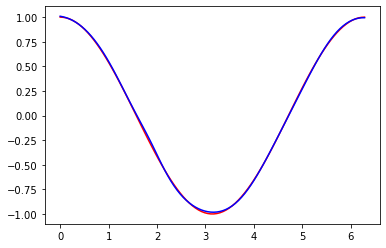

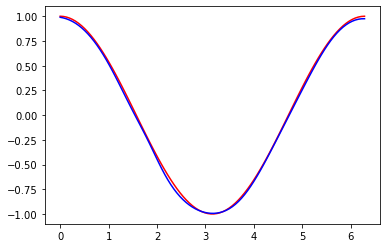

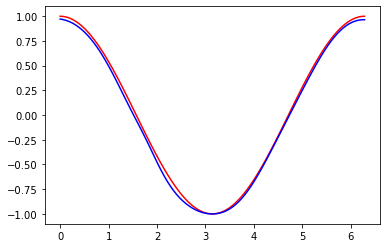

In [10]:
h_state, c_state = lstm.InitHidden()

plt.figure(1, figsize=(12, 5))
plt.ion()

for step in range(600):
    start, end = step*np.pi, (step+1)*np.pi
    steps = np.linspace(0, np.pi*2, 100, dtype=np.float32)  #从0-2pi，生成100个随机数据
    input_X = np.sin(steps)
    input_Y = np.cos(steps)
    x = torch.from_numpy(input_X).unsqueeze(0).unsqueeze(-1)
    y = torch.from_numpy(input_Y).unsqueeze(0).unsqueeze(-1)
    prediction, h_state, c_state = lstm(x, h_state, c_state)
    h_state, c_state = h_state.data, c_state.data
    loss = loss_func(prediction, y)
    opt.zero_grad()
    loss.backward()
    opt.step()

    plt.plot(steps, input_Y.flatten(), '-r')
    plt.plot(steps, prediction.data.numpy().flatten(), 'b-')
    plt.draw(); plt.pause(0.05)

plt.ioff()
plt.show()